In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Dataset: Diabetes_cleaned

### Description

This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective of the dataset is to diagnostically predict whether or not a patient has diabetes, based on certain diagnostic measurements included in the dataset. In particular, all patients here are females at least 21 years old of Pima Indian heritage.

The datasets consists of several medical predictor variables and one target variable, Outcome. Predictor variables includes the number of pregnancies the patient has had, their BMI, insulin level, age, and so on.

In [3]:
df = pd.read_csv(r"https://raw.githubusercontent.com/phonthik/Banner/main/diabetes_cleaned.csv")
df.head()

,Id,Pregnancies,Glucose,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Age_group,Outcome,BloodPressure_num
0,446,0,180.0,63.0,14.0,59.4,2.420,25,20-40,1,78
1,1214,0,180.0,63.0,14.0,59.4,2.420,25,20-40,1,78
2,1684,0,180.0,63.0,14.0,59.4,2.420,25,20-40,1,78
3,2273,0,180.0,63.0,14.0,59.4,2.420,25,20-40,1,78
4,229,4,197.0,39.0,744.0,36.7,2.329,31,20-40,0,70


# Inspect the features
Note which are numerical and which are categorical.

Check for missing values. Which features can be dropped?
Which features may we want to complete/impute?

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2768 entries, 0 to 2767
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Id                        2768 non-null   int64  
 1   Pregnancies               2768 non-null   int64  
 2   Glucose                   2768 non-null   float64
 3   SkinThickness             2768 non-null   float64
 4   Insulin                   2768 non-null   float64
 5   BMI                       2768 non-null   float64
 6   DiabetesPedigreeFunction  2768 non-null   float64
 7   Age                       2768 non-null   int64  
 8   Age_group                 2768 non-null   object 
 9   Outcome                   2768 non-null   int64  
 10  BloodPressure_num         2768 non-null   int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 238.0+ KB



---
---

From above results and also from the offical data description we can notice following things.

The dataset has the following features (columns):

*   Pregnancies: Number of times pregnant

*   Glucose: Plasma glucose concentration, 2 hours in an oral glucose tolerance test

*   BloodPressure: Diastolic blood pressure ( mmHg )

*   SkinThickness: Triceps skin fold thickness ( mm )

*   Insulin: 2-Hour serum insulin ( mu(U/ml ))

*   BMI: Body mass index (weight in  kg  / height in  meter square )

*   DiabetesPedigreeFunction: It indicates the function which scores likelihood of diabetes based on family history

*   Age: Age (in years)

*   Outcome: Whether patient is diagnosed with Diabetes (0 for No, 1 for Yes)




---


Here, the Outcome is our target variable. We clearly see that apart from the property **Outcome** all other properties are numerical and continuous in nature.

### Distribution of numerical features

In [5]:
# Use .T to transpose

df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2768.0,1384.500000,799.197097,1.000,692.750,1384.500,2076.250,2768.00
Pregnancies,2768.0,3.742775,3.323801,0.000,1.000,3.000,6.000,17.00
Glucose,2768.0,121.863439,30.503499,44.000,99.000,117.000,141.000,199.00
SkinThickness,2768.0,29.205925,9.032220,7.000,25.000,29.000,32.000,110.00
Insulin,2768.0,140.669798,82.887979,14.000,120.000,126.000,130.000,846.00
BMI,2768.0,32.593750,7.101190,18.200,27.600,32.400,36.600,80.60
DiabetesPedigreeFunction,2768.0,0.471193,0.325669,0.078,0.244,0.375,0.624,2.42
Age,2768.0,33.124639,11.773123,21.000,24.000,29.000,40.000,81.00
Outcome,2768.0,0.343931,0.475104,0.000,0.000,0.000,1.000,1.00
BloodPressure_num,2768.0,72.385838,11.988549,24.000,64.000,72.000,80.000,122.00


### Check for the Null Values

Should not have any as we have already cleaned

In [6]:
df.isnull().sum()

Id                          0
Pregnancies                 0
Glucose                     0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Age_group                   0
Outcome                     0
BloodPressure_num           0
dtype: int64

# Exploratory Data Analysis

In this section, we will start visualizing the features of the dataset one by one. Firstly, **Univariate** feature visualization will be done, then we will move onto **Multivariate** feature visualization.

## Univariate (single variable)

### Bar Chart

#### Analysis of Pregnancies

As observed, `Pregnancies` is a **Quantitative** feature. There are many plots to analyse these type of data. Histograms, Box plots and Violin plots, are useful to know how the data is distributed.

### Histogram & Boxplot

<Axes: xlabel='Pregnancies'>

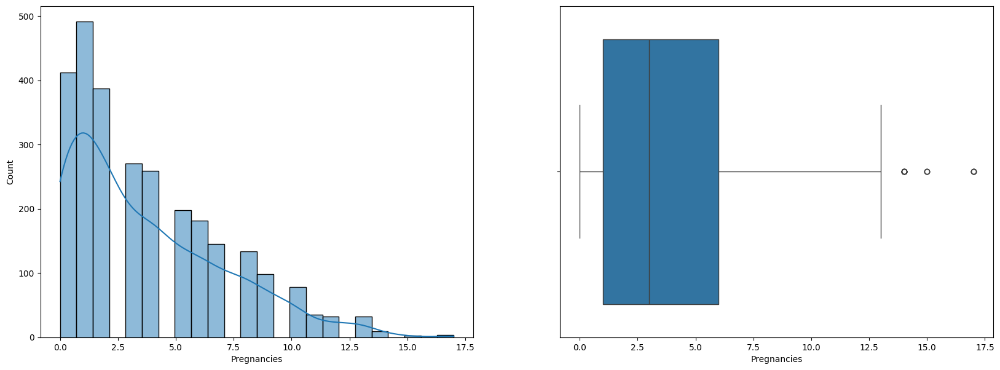

In [7]:
fig1, ax1 = plt.subplots(1, 2, figsize=(20, 7))

sns.histplot(data=df, x="Pregnancies", kde=True, ax=ax1[0])
sns.boxplot(data=df, x="Pregnancies", ax=ax1[1])

In [8]:
df['Pregnancies'].describe()

count    2768.000000
mean        3.742775
std         3.323801
min         0.000000
25%         1.000000
50%         3.000000
75%         6.000000
max        17.000000
Name: Pregnancies, dtype: float64

In [9]:
df['Pregnancies'].median()

3.0

In [10]:
df["Pregnancies"].value_counts()

1     491
0     412
2     387
3     270
4     259
5     198
6     181
7     145
8     134
9      98
10     78
11     35
13     32
12     32
14      9
17      4
15      3
Name: Pregnancies, dtype: int64

#### Analysis of Outcome (Target Variable)

A Count plot and a Pie chart will be two useful plots to analyse the `Outcome` column as it is a categorical feature. Usefulness in the sense, both the plots will allow us to observe the distribution of each category in the feature.

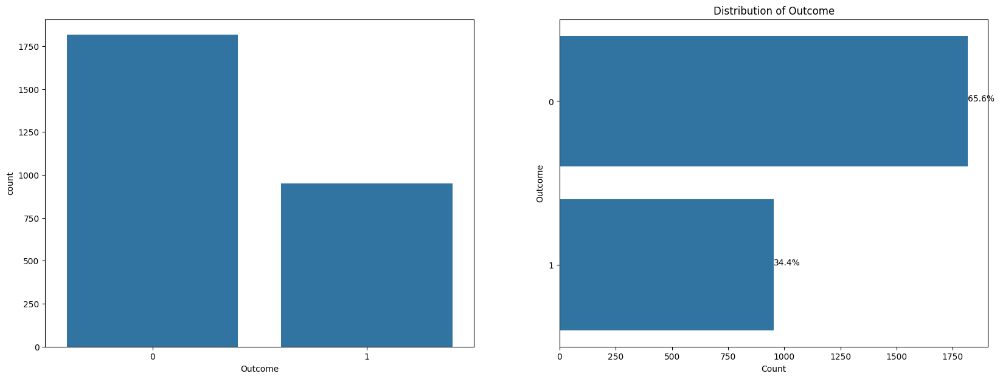

In [11]:
fig, ax = plt.subplots(1, 2, figsize=(20, 7))

sns.countplot(data=df, x="Outcome", ax=ax[0])


ax = sns.countplot(y="Outcome", data=df)
plt.title('Distribution of Outcome')
plt.xlabel('Count')

total = len(df['Outcome'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

### Multivariate Analysis

#### Analysis of Glucose and Outcome

Since `Glucose` is a continuous feature, we plot a histogram with its hue based on `Outcome`.

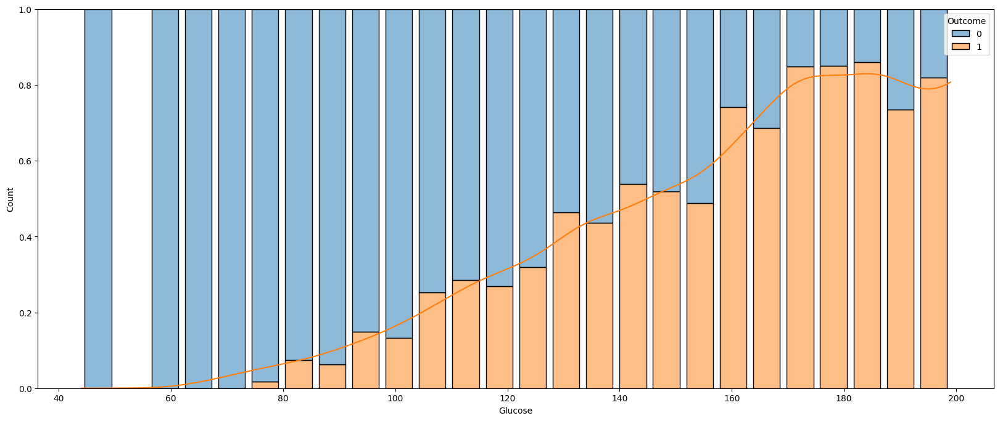

In [12]:
fig15, ax15 = plt.subplots(figsize=(20, 8))

sns.histplot(data=df, x="Glucose", hue="Outcome", shrink=0.8, multiple="fill", kde=True, ax=ax15)
plt.show()

From the above plot, a **positive linear correlation** is evident for `BMI`.

- As the value of `Glucose` increases, the count of patients having diabetes increases i.e. value of `Outcome` as 1, increases.
- Also, after the `Glucose` value of **125**, there is a steady increase in the number of patients having `Outcome` of 1.
- Note, when `Glucose` value is 0, it means the measurement is missing. We need to fill that values with the *mean* or *median* and then it will make sense.

So, there is a significant amount of *positive* linear correlation.

### Density Plot

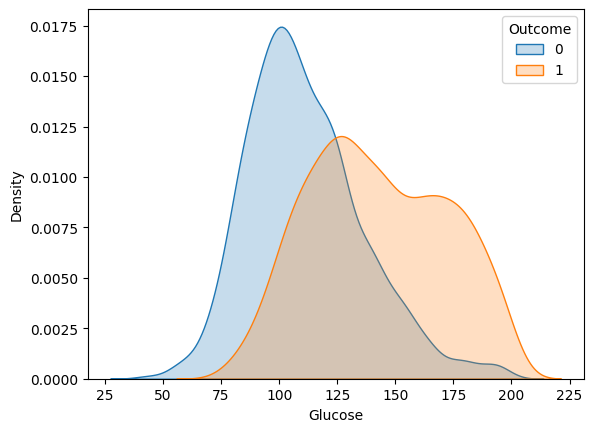

In [13]:
import warnings
warnings.filterwarnings("ignore")

sns.kdeplot(data=df, x=df.loc[(df["Outcome"] == 0),'Glucose'],
                 hue = "Outcome", fill=True)
sns.kdeplot(data=df, x=df.loc[(df["Outcome"] == 1),'Glucose'],
                 hue = "Outcome", fill=True)
plt.show()

#### Analysis of BloodPressure and Outcome

`BloodPressure` is continuous and `Outcome` is binary feature. So, plotting a histogram for `BloodPressure` with its hue based on `Outcome`.

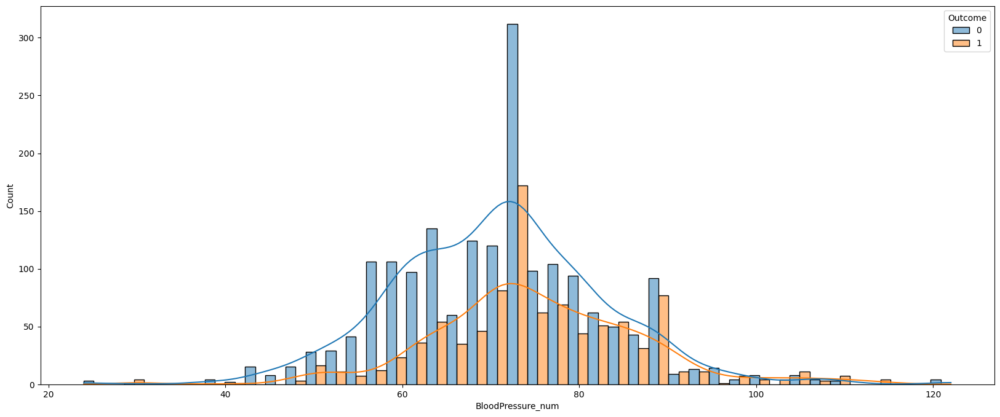

In [14]:
fig16, ax16 = plt.subplots(figsize=(20, 8))

sns.histplot(data=df, x="BloodPressure_num", hue="Outcome", multiple="dodge", kde=True, ax=ax16,)
plt.show()

We observe that, `Outcome` and `BloodPressure` do **NOT** have a positive or negative linear correlation. The value of `Outcome` do not increase linearly as value of `BloodPressure` increases.

However, for `BloodPressure` values greater than 82, count of patients with `Outcome` as 1, is more.

#### Analysis of BMI and Outcome

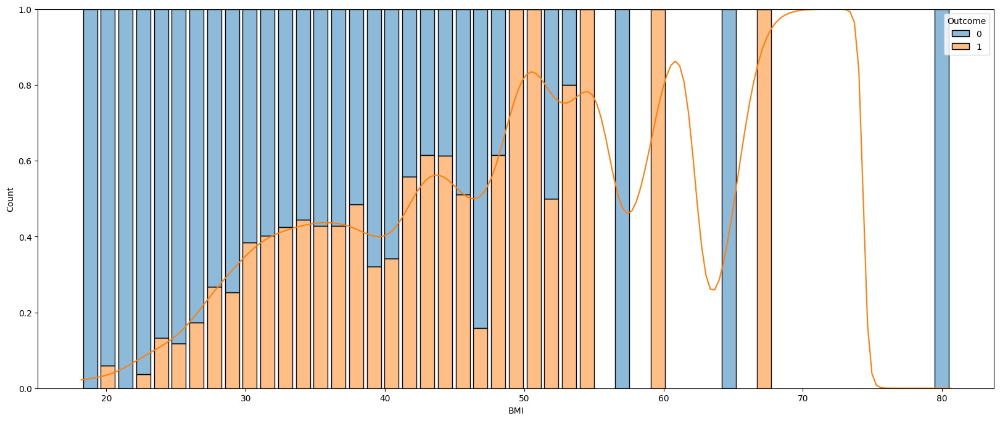

In [15]:
fig17, ax17 = plt.subplots(figsize=(20, 8))

sns.histplot(data=df, x="BMI", hue="Outcome", shrink=0.8, multiple="fill", kde=True, ax=ax17)
plt.show()

From the above plot, a **positive linear correlation** is evident for `BMI`.

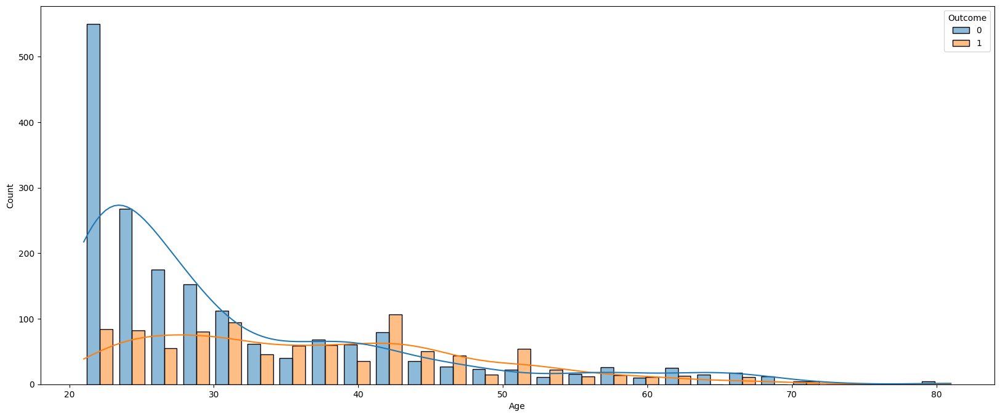

In [16]:
fig18, ax18 = plt.subplots(figsize=(20, 8))

sns.histplot(data=df, x="Age", hue="Outcome", shrink=0.8, multiple="dodge", kde=True, ax=ax18)
plt.show()

For `Age` greater than 35 years, the chances of patients having diabetes increases as evident from the plot i.e. The number of patients having diabetes is more than the number of people **NOT** having diabetes. But, it does not hold true for ages like **60+**, somehow.

There is *some* positive linear correlation though.

---

---

### Analyzing Correlations

## Pairplot

The Seaborn Pairplot allows us to plot pairwise relationships between variables within a dataset. This creates a nice visualisation and helps us understand the data by summarising a large amount of data in a single figure.

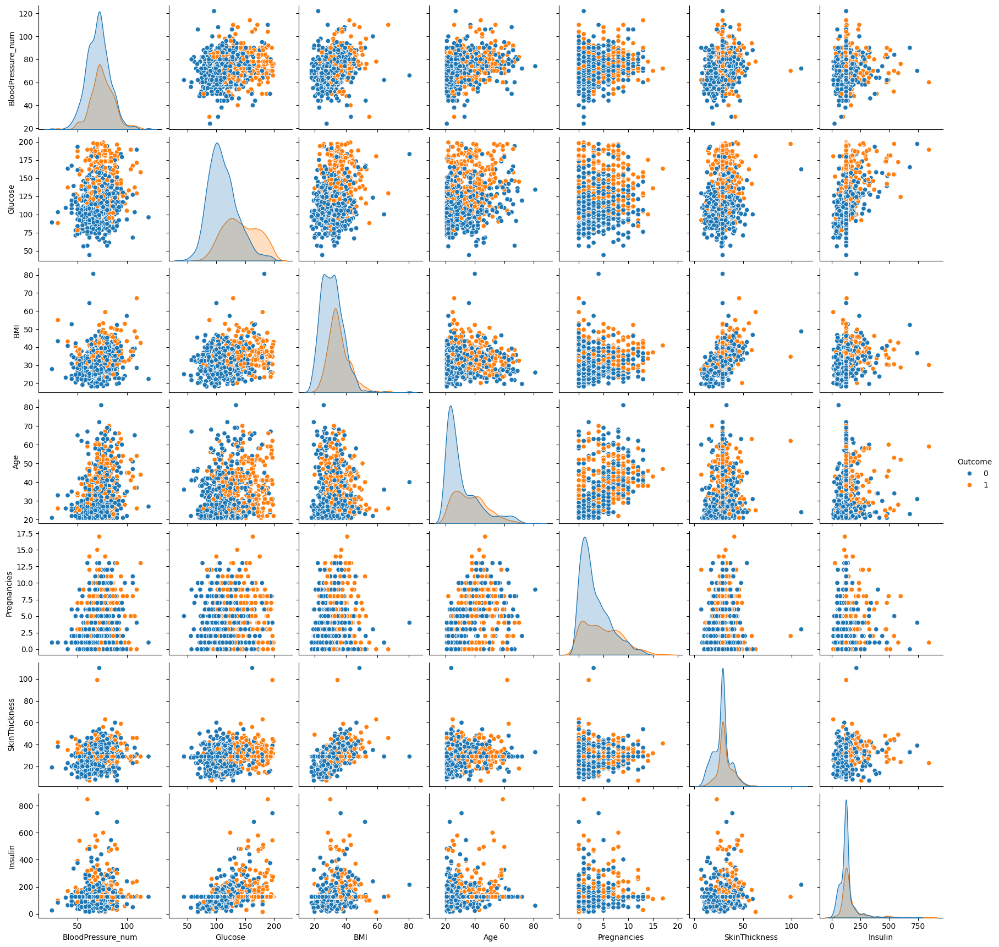

In [17]:
sns.pairplot(data=df, vars=['BloodPressure_num', 'Glucose', 'BMI', 'Age', 'Pregnancies', 'SkinThickness', 'Insulin'],
             hue='Outcome')

  -  From scatter plots, to me only BMI & SkinThickness and Pregnancies & Age seem to have positive linear relationships. Another likely suspect is Glucose and Insulin.
  -  There are no non-linear relationships
  -  Lets check it out with Pearson Correlation and plot heat maps

In [18]:
df.head()

,Id,Pregnancies,Glucose,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Age_group,Outcome,BloodPressure_num
0,446,0,180.0,63.0,14.0,59.4,2.420,25,20-40,1,78
1,1214,0,180.0,63.0,14.0,59.4,2.420,25,20-40,1,78
2,1684,0,180.0,63.0,14.0,59.4,2.420,25,20-40,1,78
3,2273,0,180.0,63.0,14.0,59.4,2.420,25,20-40,1,78
4,229,4,197.0,39.0,744.0,36.7,2.329,31,20-40,0,70


In [19]:
# prompt: create a new dataframe from df but drop age_group

df_new = df.drop(columns=['Age_group'])
df_new

,Id,Pregnancies,Glucose,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,BloodPressure_num
0,446,0,180.0,63.0,14.0,59.4,2.420,25,1,78
1,1214,0,180.0,63.0,14.0,59.4,2.420,25,1,78
2,1684,0,180.0,63.0,14.0,59.4,2.420,25,1,78
3,2273,0,180.0,63.0,14.0,59.4,2.420,25,1,78
4,229,4,197.0,39.0,744.0,36.7,2.329,31,0,70
...,...,...,...,...,...,...,...,...,...,...
2763,949,6,87.0,29.0,126.0,23.2,0.084,32,0,80
2764,2107,6,87.0,29.0,126.0,23.2,0.084,32,0,80
2765,269,0,102.0,29.0,126.0,25.1,0.078,21,0,52
2766,1037,0,102.0,29.0,126.0,25.1,0.078,21,0,52


Let us plot a **heatmap** of the correlation matrix of different features.

In [20]:
# The 2D correlation matrix
corr_matrix = df_new.corr()

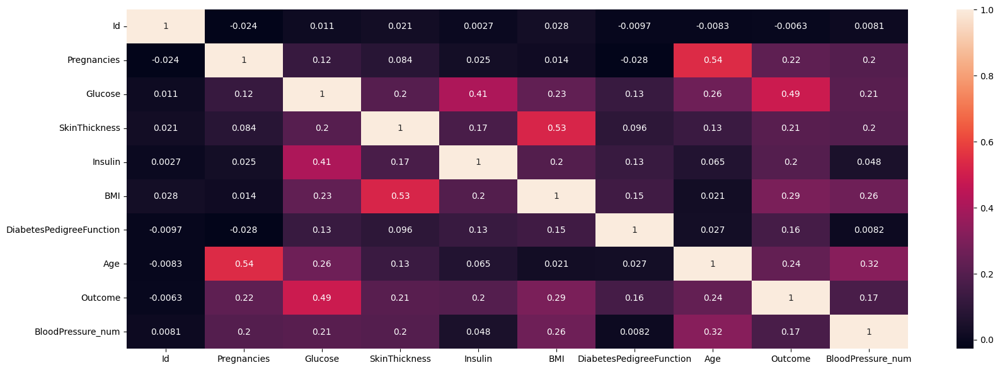

In [21]:
# Plotting the heatmap of corr

fig20, ax20 = plt.subplots(figsize=(20, 7))
dataplot = sns.heatmap(data=corr_matrix, annot=True, ax=ax20)
plt.show()

In [22]:
cor = df_new.corr(method ='pearson')
import pandas as pd; import numpy as np
cor = cor.reset_index()
cor

,index,Id,Pregnancies,Glucose,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,BloodPressure_num
0,Id,1.000000,-0.024222,0.010625,0.021209,0.002722,0.027547,-0.009695,-0.008286,-0.006298,0.008125
1,Pregnancies,-0.024222,1.000000,0.123436,0.084142,0.025340,0.014363,-0.027731,0.539974,0.223796,0.201053
2,Glucose,0.010625,0.123436,1.000000,0.203349,0.410528,0.231526,0.127984,0.262241,0.489074,0.205145
3,SkinThickness,0.021209,0.084142,0.203349,1.000000,0.172661,0.525186,0.096492,0.128886,0.207343,0.198535
4,Insulin,0.002722,0.025340,0.410528,0.172661,1.000000,0.196204,0.125229,0.065096,0.199406,0.047768
5,BMI,0.027547,0.014363,0.231526,0.525186,0.196204,1.000000,0.145126,0.021208,0.290065,0.264475
6,DiabetesPedigreeFunction,-0.009695,-0.027731,0.127984,0.096492,0.125229,0.145126,1.000000,0.026949,0.160664,0.008242
7,Age,-0.008286,0.539974,0.262241,0.128886,0.065096,0.021208,0.026949,1.000000,0.236242,0.323594
8,Outcome,-0.006298,0.223796,0.489074,0.207343,0.199406,0.290065,0.160664,0.236242,1.000000,0.171804
9,BloodPressure_num,0.008125,0.201053,0.205145,0.198535,0.047768,0.264475,0.008242,0.323594,0.171804,1.000000


In [23]:
corr_matrix["Outcome"].sort_values(ascending=False)

Outcome                     1.000000
Glucose                     0.489074
BMI                         0.290065
Age                         0.236242
Pregnancies                 0.223796
SkinThickness               0.207343
Insulin                     0.199406
BloodPressure_num           0.171804
DiabetesPedigreeFunction    0.160664
Id                         -0.006298
Name: Outcome, dtype: float64

# ydata-profiling library in Python to generate detailed reports for datasets

Pandas Profiling is used to generate a complete and exhaustive report for the dataset, with many features and customizations in the generated report. This report includes various pieces of information such as dataset statistics, distribution of values, missing values, memory usage, etc., which are very useful for exploring and analyzing data efficiently.

In [33]:
# Using PIP:
# Open a command prompt or terminal and run the following command:
!pip install ydata-profiling

In [44]:
!pip install matplotlib

In [45]:
# Using PIP:
# Open a command prompt or terminal and run the following command:
# pip install ydata-profiling

# Using Conda:
# Open the Anaconda PowerShell Prompt and run the following command:
# conda install -c conda-forge ydata-profiling

from ydata_profiling import ProfileReport

In [46]:
profile = ProfileReport(df, title="Diabetes EDA")
profile.to_notebook_iframe()
profile.to_file("books_data.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# sweetviz library

conda install conda-forge::sweetviz

In [47]:
!pip install sweetviz

In [49]:
import sweetviz as sv

                                             |          | [  0%]   00:00 -> (? left)


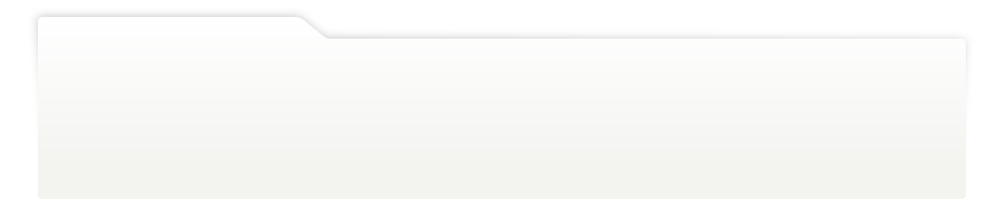
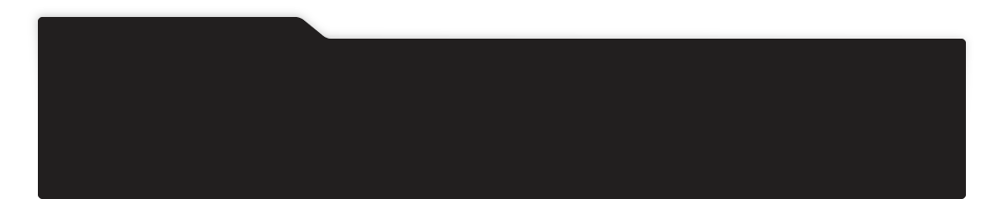
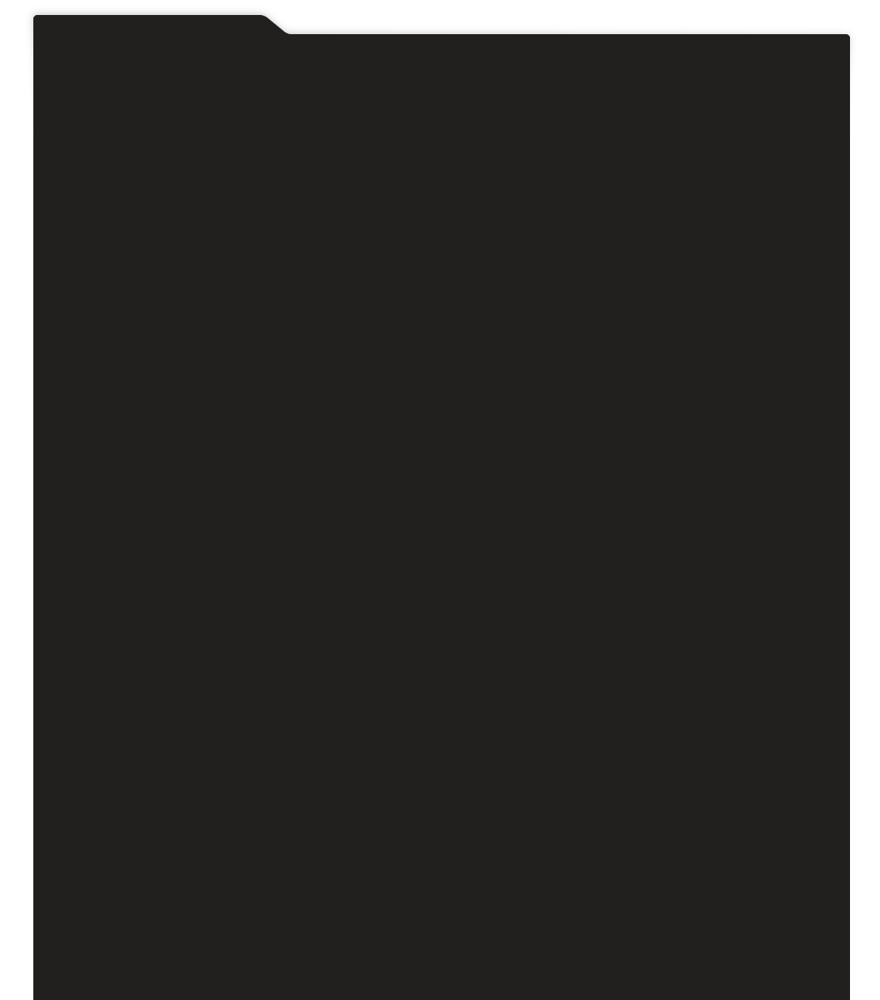
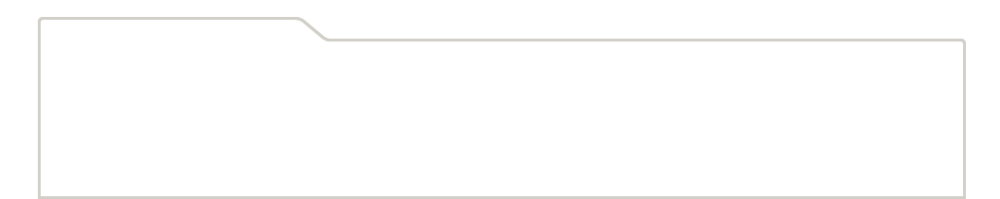
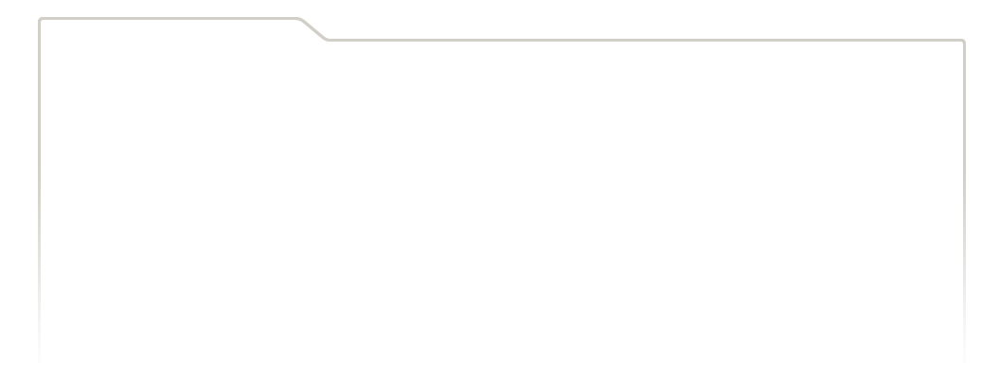
...
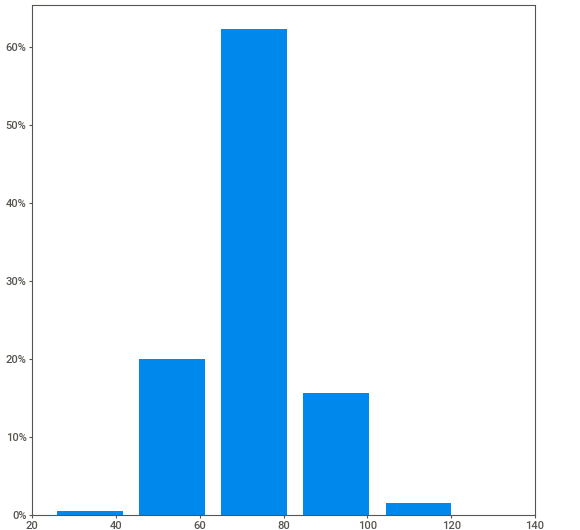
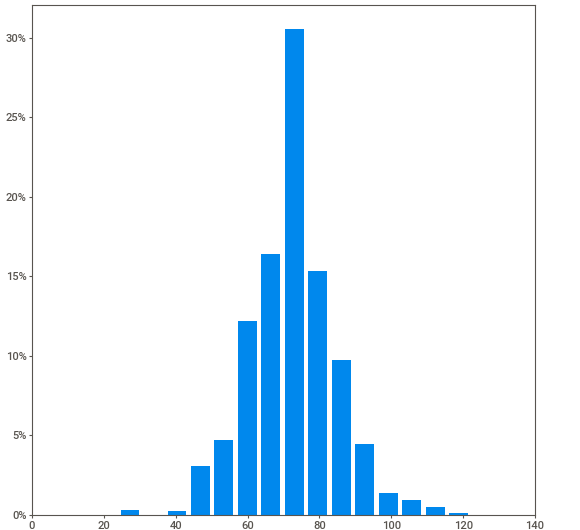
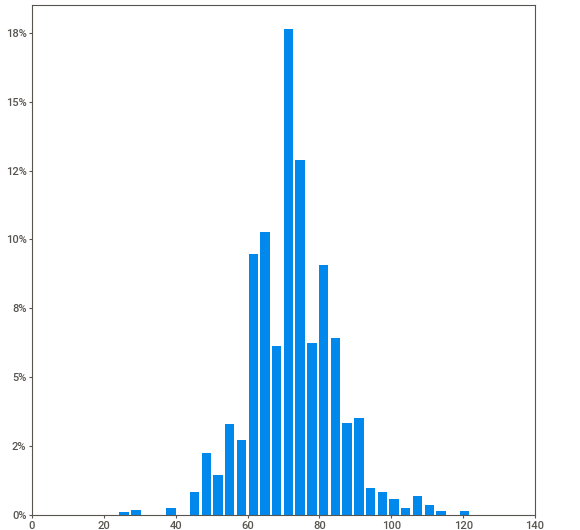
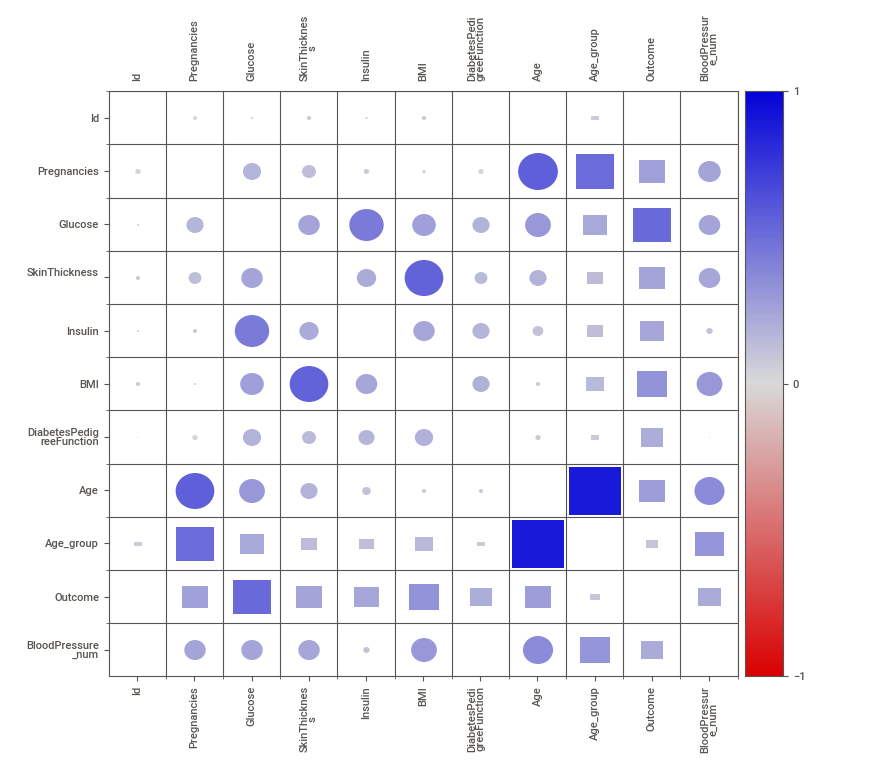
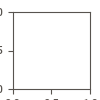

In [50]:
diabetes_report_2=sv.analyze(df)
diabetes_report_2.show_notebook(w="100%", h="900")

## bamboolib - a GUI for pandas

bamboolib is a GUI for pandas DataFrames that enables anyone to work with Python in Jupyter Notebook or JupyterLab

Intuitive GUI that exports Python code
Supports all common transformations and visualizations
Transformations come with full keyboard control
Provides best-practice analyses for data exploration
Add custom transformations, visualizations and data loaders via simple Python plugins.

In [59]:
!pip install bamboolib

In [57]:
from google.colab import output
output.enable_custom_widget_manager()

In [60]:
# pip install bamboolib
import bamboolib as bam
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv(r"https://raw.githubusercontent.com/phonthik/Banner/main/diabetes_cleaned.csv")
df

        Id  Pregnancies  Glucose  SkinThickness  Insulin   BMI  \
0      446            0    180.0           63.0     14.0  59.4   
1     1214            0    180.0           63.0     14.0  59.4   
2     1684            0    180.0           63.0     14.0  59.4   
3     2273            0    180.0           63.0     14.0  59.4   
4      229            4    197.0           39.0    744.0  36.7   
...    ...          ...      ...            ...      ...   ...   
2763   949            6     87.0           29.0    126.0  23.2   
2764  2107            6     87.0           29.0    126.0  23.2   
2765   269            0    102.0           29.0    126.0  25.1   
2766  1037            0    102.0           29.0    126.0  25.1   
2767  2195            0    102.0           29.0    126.0  25.1   

      DiabetesPedigreeFunction  Age Age_group  Outcome  BloodPressure_num  
0                        2.420   25     20-40        1                 78  
1                        2.420   25     20-40        1 

Support for third party widgets will remain active for the duration of the session. To disable support:

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()